# Autonomous Vision: Multimodal Perception and Decision-Making System

### Computer Vision for Mapping of the environment

Robotics can be broken down into a three step cycle:
* Step 1: Sensing our environment accuratly.
* Step 2: Decide what to do based on that data.
* Step 3: Perform an action based on that decision. And Repeat

<div class="img-with-text">
    <img src="img/robotics_cycle.png" alt="sometext" style="width: 200px;"/>
    <p style="text-align: center;"><b>Fig. 1:</b><em>(Three basic steps of robotics)</em></p>
</div>

Computer Vision deals with perception which is the first step in robotics. According to Sebastian Thrun, *80% of the challenge of building self-driving cars is perception*. So, Computer vision is the art and science of percieving the environment around us using images. It can help us detect lane lines, obsticles, vehicles, pedestrians e.t.c. This gives us a map of the environment around us. 

Cameras and Computer Vision are a great techniques with it's own pros and cons. Cameras are cheaper that more sophisticated technologies such as Lasers and Radars. Laser and Radars give us a complete 3D map of our environment while cameras only give us 2D images. But the images from cameras have a greater resolution compared to that of Laser and Radar. Also, Camaera are very cheap compared to Laser and Radar technology.

we made a basic program that could detect straight lane lines along the road. In this module we will apply more advanced computer vision techniques in order to make a higly robust lane finding algorithm which can detect;
* Curvy lanes
* Can detect lane lines correctly even if there are shadows
* Ignores changes of the pavment color e.t.c.



<div class="img-with-text">
    <img src="https://profalbrecht.files.wordpress.com/2009/07/road01.jpg" alt="Curvy Road" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 2:</b><em> (Curvy Road) Credits: [profalbrecht.wordpress.com](https://profalbrecht.wordpress.com)</em></p>
</div>

This will help us in finding the distance of the vehicles from the lane lines and the curvature of the road ahead. This information is higly useful for making control decisions in a self-driving car.

After following the Advanced Lane Finding module we have the Vehicle Detection and Tracking module. The vehicles detection and tracking module will let us know the exact position of other vehicles relative to us. This information is needed when making decision about changing lanes, acceleration and decelleration. 

By combining the _Advanced Lane Finding_ module and the _Vehicle Detection and Tracking_ module we will make a program that tells us exactly where the cars is on the road and the vehicles in it's way.

## Advanced Lane Finding

In this module we need to measure some of the quantities need to control the car. For example, in order to steer the car we need to know the curvature of the road in front of us. In order measure the curvature of the road we need to apply a transform to the images which gives us a top view of the road in front of us.

<div class="img-with-text">
    <img src="img/transform.png" alt="Curvy Road" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 3:</b><em> (Tranform from front view to top view )</em></p>
</div>

#### Distortions in Images

In order to get this perspective tranformation right we need to remove distortion from the images which are caused due to camera lens. These distortions skew the objects at the edges of the images and will lead to in accurate results if we don't remove them before hand. Distortion occur when a camera tranforms 3D objects in the real world into 2D images. The distortion change the shapes and sizes of the objects in the images. They can also cause an object to appear closer, or farther away than it actually is.

The our case these distortions may lead to incurrate calculations of the curvature of the road, which in turn will lead to higly undesired steering angles. So, it is crucial that we remove these distortions first.

<div class="img-with-text">
    <img src="img/distortions.png" alt="Distortion" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 4:</b><em> (Distortions due to camera lenses. Credits: Udacity)</em></p>
</div>

Before we jump to writing code in order to correct for distortions in the images, we need to discuss the theory behind these distortions so that we can model them properly. 

The simplest and oldest model of a camera is the pin hole camera. A pinhole camera is similar to our eyes. Rays of light starting from the object pass through a very small and are focused on back of our eyes, or in case of a camera a screen or detector. During this process, rays of light from the top of the object stick and form the bottom part of it's image and vise versa. Similar is the case for the left and right parts of the object. So, after this we get an upside down image of the object on a screen.

<div class="img-with-text">
    <img src="img/pinhole_camera.png" alt="Pinhole camera" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 5:</b><em> (Pihole camera and human eye. Credits: Udacity)</em></p>
</div>

A camera tranforms an object in 3D to an image in 2D. This is can be modelled by a matrix tranformation with a matrix which we call the camera matrix. 

<div class="img-with-text">
    <img src="img/3dto2d.png" alt="3D to 2D" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 6:</b><em> (Camera Tranform. Credits: Udacity)</em></p>
</div>

But nowadays cameras don't use pinholes, they use lens, and lens can cause rays of light to bend unusually, leading to distortions in the image that is formed. This type of distortion that is caused by the unusal bending of rays is called **Radial Distortion**

There is another type of distortion known as **Tangential Distortion**. This type of distortion leads to the place of the image bieng distorted. It is caused when the plane containing the lens is not parallel to that containing our sensor or screen. 

<div class="img-with-text">
    <img src="img/tangential_distortion.png" alt="Tangential Distortion" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 7:</b><em> (Tangential distortion. )</em></p>
</div>

All of these distortion can modelled using five coefficients known as **Distortion Coefficients**. The values of these coefficients model the amount of Radial and Tangential distortions. These coefficients are unique for each camera, and if we know them we can undistort all of the images from that camera.

These coefficients are **(k1, k2, p1, p2, and k3)**. **k1, k2** and **k3** model the Radial Distortion in an image, and **p1 and p2** model the Tangential Distortion in it. To correct the appearance of a radially distorted image we can use a correction formula. 

Suppose *(x,y)* is a point in the distorted image, in order correct for the distortion OpenCV calculates the radial distance between a point in an undistorted image *(x_corrected, y_corrected)* and the center of distortion *(x_c, y_c)* (*This is the place or point which is at it's original postion*), usually this will be at the center of the image. Let's call this distance **r**.

<div class="img-with-text">
    <img src="https://d17h27t6h515a5.cloudfront.net/topher/2016/December/5840ae19_screen-shot-2016-12-01-at-3.10.19-pm/screen-shot-2016-12-01-at-3.10.19-pm.png" alt="Radial Distance" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 8:</b><em> (The radial distance from a corrected point to the distortion center <b>r</b>. Credits: Udacity)</em></p>
</div>

**Note:** **k3** *is used for modelling major distortion, and in case of minor distortion it usually has a value at or close to zero. In OpenCV one can ignore this coefficient, but we will be using this coefficient in all our models so that it applying in wider range of scinareos and correct for both major and minor distortions*

The formula for correction of **Radial Distortion** is as follows

```python
x_corrected = x * (1 + k1 * r**2 + k2 * r**4 + k3 * r**6)
y_corrected = y * (1 + k1 * r**2 + k2 * r**4 + k3 * r**6)
```

The formuala for correction of **Tangential Distortion** is as follows

```python 
x_corrected = x + (2*p1*x*y + p2*(r**2 + 2*x**2))
y_corrected = y + (p1*(r**2 + 2*y**2) + 2*p2*x*y)
```

As we know that distoration can change the shapes, sizes and distances between objects. In order correct for these distortions we need to compare images taken by a specfic camera of an object to it's original form so we create a map between distorted and undistored images. In order to do that we need a good control object. A **Chess Board** is a great example of such an object. It has a regular and contrasting pattern which is easily detectable. So using this pattern we can automatically calibrate for our camera and find a mapping from distorted to undistorted points.

<div class="img-with-text">
    <img src="img/map_to_undistorted.png" alt="Map to undistorted" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 9:</b><em> (Find a map from distorted points to undistorted ones, for a chess board. Credits: Udacity)</em></p>
</div>

### Finding Corners

In this exercise we will use OpenCV's **`findChessBoardCorners()`** and **`drawChessBoardCorners`** to automatically find and draw the chess board corners in an image of a Chess Board.

<div class="img-with-text">
    <img src="https://d17h27t6h515a5.cloudfront.net/topher/2016/November/583dcf04_corners-found3/corners-found3.jpg" alt="Chess Board Corners" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 10:</b><em> (Find and draw corners of the pattern on a chess board. Credits: Udacity)</em></p>
</div>

The documentation for these functions can found here, [`findChessBoardCorners()`](http://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#cv2.findChessboardCorners) and [`drawChessBoardCorners`](http://docs.opencv.org/2.4/modules/calib3d/doc/camera_calibration_and_3d_reconstruction.html#cv2.drawChessboardCorners).

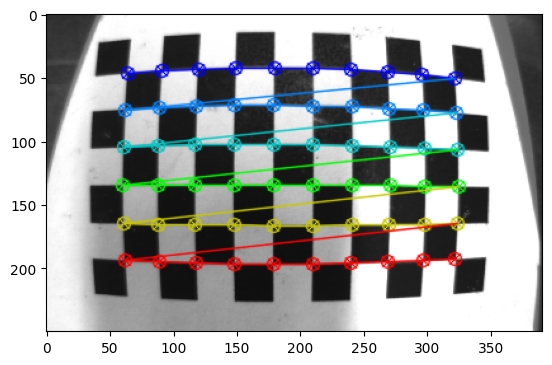

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# prepare object points
nx = 10 #TODO: enter the number of inside corners in x
ny = 6 #TODO: enter the number of inside corners in y

# Make a list of calibration images
fname = 'img/chess_board.png'
img = cv2.imread(fname)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Find the chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# If found, draw corners
if ret == True:
    # Draw and display the corners
    cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
    plt.imshow(img)
    plt.imsave('output_images/chess_board_with_corners.jpg',img)
    plt.show()
else:
    print("No corners returned!")

### Camera Calibration

In this section we will calibrate the camera with images from various perspectives of a chess board. In order to do that the lessons recommend that we use at least 20 images to calibrate our camera.

The data we are given has 20 calibration images, and one test image. 

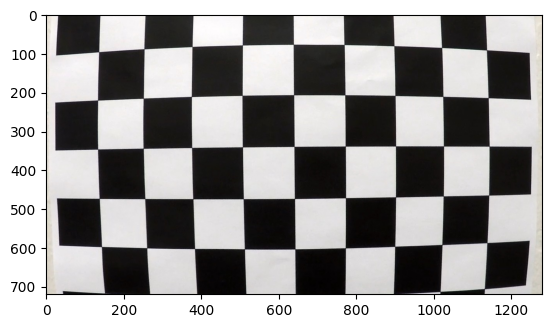

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import matplotlib.image as mpimg

%matplotlib inline

ex_image = mpimg.imread('camera_cal/calibration1.jpg')

'''Example plot'''
plt.imshow(ex_image)
plt.show()

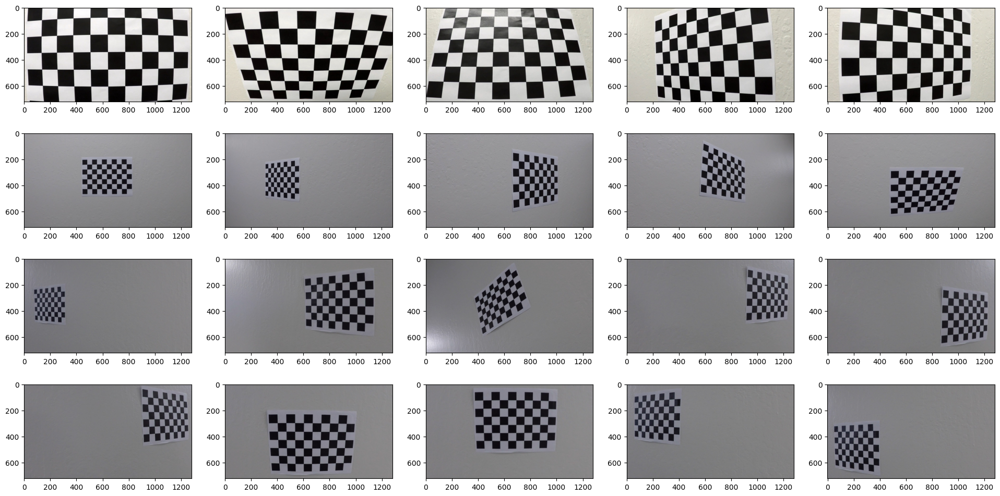

In [3]:
'''Importing all 20 calibration images'''
calibr_imgpaths = ['camera_cal/calibration'+str(i)+'.jpg' for i in range(1,21)]

'''plotting all the images'''
fig, ax = plt.subplots(4,5)
fig.set_size_inches(24,12)

for i, j in np.ndindex((5,4)):
    ax[j][i].imshow(mpimg.imread(calibr_imgpaths[j*5+i]))
    
plt.show()

Object points will all be the known coordinates for all the corner in a regular 8x6 Chess Board. They are from (0,0,0) to (7,5,0). The third coordinate represents the z-value and is zero for all the corner as we want the final image to lie on a flat level.


<div class="img-with-text">
    <img src="img/obj_pnts.png" alt="Object Points" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 11:</b><em> (Object points of the chess board in 3D space)</em></p>
</div>

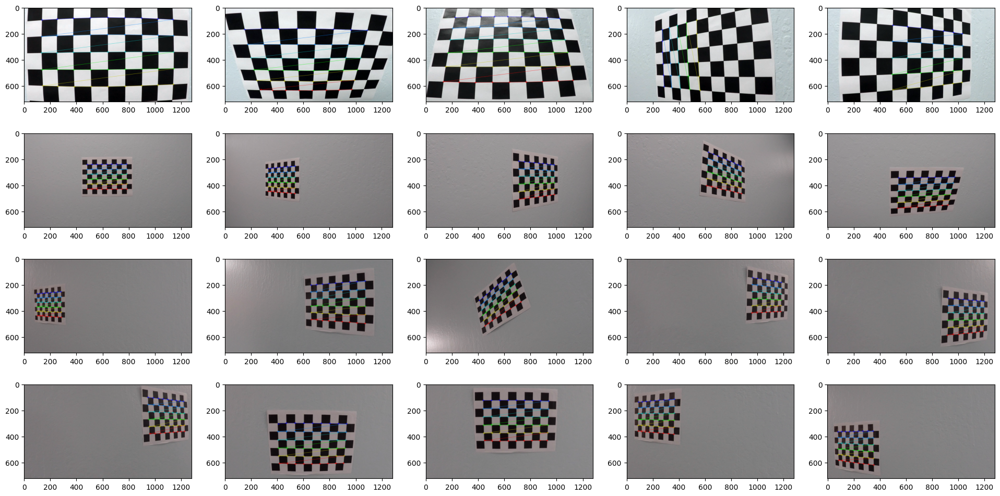

In [4]:
# Arrays to hold object points and image points for all the images

obj_pnts = [] # 3D points of the object in real space
img_pnts = [] # 2D points in the image plane

'''Plotting corners in all the images'''
fig, ax = plt.subplots(4,5)
fig.set_size_inches(24,12)

num_corners = [(8,6),(9,6),(9,5),(7,5),(7,6),(6,5)]

for i, j in np.ndindex((5,4)):
    # Load the image 
    img = cv2.imread(calibr_imgpaths[j*5+i])
    
    # Convert to grey scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the Chess board corners in the image
    for cor in num_corners:
        ret, corners = cv2.findChessboardCorners(gray,cor, None)
        if(ret):
            cornerss = cor
            break

    # Plot the Chess Board corners
    if ret:
        image = cv2.drawChessboardCorners(img,cornerss, corners, ret)
        plt.imsave('output_images/chess_board_with_corners_'+str(i)+'_'+str(j)+'.jpg',image)
        ax[j][i].imshow(image)
        img_pnts.append(corners)
        
        # Prepare object points, like (0,0,0), (1,0,0), ......., (7,5,1)
        objp = np.zeros((cornerss[0]*cornerss[1], 3), np.float32)
        objp[:,:2] = np.mgrid[0:cornerss[0],0:cornerss[1]].T.reshape(-1, 2) #x, y coordinates

        obj_pnts.append(objp)
        
plt.show()

Ok! so now that we have all of the object points and image points, we will use them to calibrae our camera.

Now we undistort a sample image.

In [5]:
image = mpimg.imread(calibr_imgpaths[0])
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_pnts, img_pnts, gray.shape[::-1],None,None)

def undistort(image, matrix, distMatrix):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return cv2.undistort(image, matrix, distMatrix)

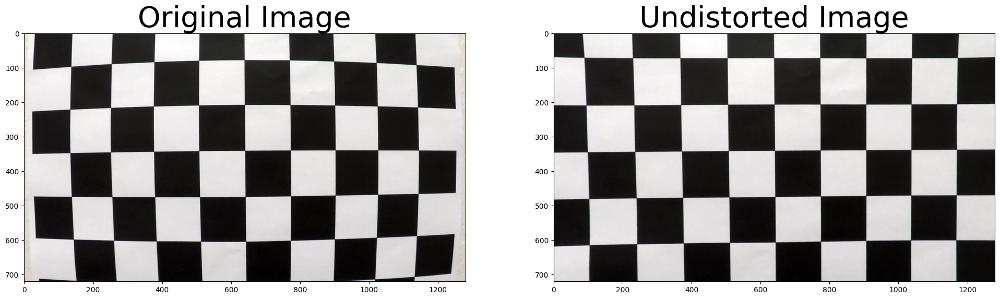

In [6]:
image = mpimg.imread(calibr_imgpaths[0])

undistorted = undistort(image, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=40)
plt.savefig('output_images/'+'undistorted',bbox_inches='tight')
plt.show()

### Lane Curvature

Self-driving cars need to be told the correct steering angle to turn, left or right. You can calculate this angle if you know a few things about the speed and dynamics of the car and how much the lane is curving.

One way to calculate the curvature of a lane line, is to fit a **2nd** degree polynomial to that line, and from this you can easily extract useful information.

For a lane line that is close to vertical, you can fit a line using this formula: **f(y) = Ay^2 + By + C**, where A, B, and C are coefficients.

A gives you the curvature of the lane line, B gives you the heading or direction that the line is pointing, and C gives you the position of the line based on how far away it is from the very left of an image `(y = 0)`.

<div class="img-with-text">
    <img src="img/process.png" alt="Curvature Detection process" style="width: 900px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 12:</b><em> (Curvature Detection Procedure.)</em></p>
</div>

### Perspective Transform

**Perspective:** _Objects seem smaller the farther away they are from the viewing point. Parallel line seem to converge to a single point in the horizon._ 

<div class="img-with-text">
    <img src="img/perspect.png" alt="Perspective" style="width: 400px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 13:</b><em> (Perspective on a road.)</em></p>
</div>

Hence, the greater the z-coordinate of an object, the smaller it will appear to be in a image. A perspective transform uses this information to transform an image.

<div class="img-with-text">
    <img src="img/perspective_trans.png" alt="Perspective Transform" style="width: 400px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 14:</b><em> (Perspective transform.)</em></p>
</div>

Using this technique, we can convert an image of a road into a bird's eye view of that road. Infact we can do various types of transforms, even viewing the road from the bottom.

<div class="img-with-text">
    <img src="img/birds_eye_view.png" alt="Bird's Eve View" style="width: 600px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 15:</b><em> (Bird's Eye view of the road using perspective transform. Credits: Udacity)</em></p>
</div>

Using birds eye view of the road it is easir to find the curvature of the road. If we use the simple image then, at the father end of the road the lines to morve confusing thier curvature becomes. While in a bird's eye view, we can clearly detect the curvature of the road.

<div class="img-with-text">
    <img src="img/transform_to_bird.png" alt="Bird's Eye View of Curvature" style="width: 600px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 16:</b><em> (Bird's Eye view is better for finding curvature.)</em></p>
</div>

Lets apply perspective tranform to a stop sign,

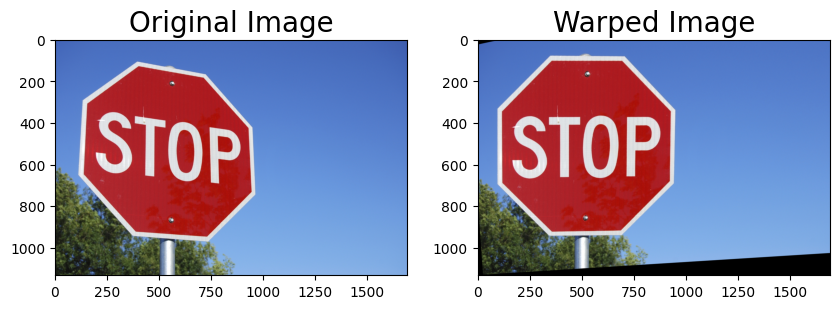

In [7]:
%matplotlib inline

def warp(img, src, dst): 
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # get warped image
    warped = cv2.warpPerspective(img, M, img.shape[0:2][::-1], flags=cv2.INTER_LINEAR)
    return warped, Minv

stop_img = mpimg.imread('img/stop_sign.jpg')

# Four source points
src = np.float32([[140,291],[932,413],[952,733],[120,636]])

# Four destination points
dst = np.float32([[100,330],[930,330],[930,680],[100,680]])

warped, Minv = warp(stop_img, src, dst)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(stop_img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(warped)
ax2.set_title('Warped Image', fontsize=20)
plt.savefig('output_images/warping',bbox_inches='tight')
plt.show()

Now let's undistort and apply perspective transform on an image of a chess board.

In project 1 of the Nanodegree, we used the Canny Edge Algorithm to find pixels that where likely to be part of a line in an image. But canny detection is inffiecient in the sence that it detect all the lines/edges in an image but we are looking for only a specific set of lines. Using Gradient threshold we can retrieve only those lines which are close to vertical and ignore the rest of them, these lines are of our interest.

### Sobel Operator

The Sobel Operator is at the heart of Canny Edge detection. If is a way of getting the derivative of an image in the **X** or **Y** direction. 


<div class="img-with-text">
    <img src="http://d17h27t6h515a5.cloudfront.net/topher/2016/December/584cbe5e_soble-operator/soble-operator.png" alt="Sobel" style="width: 300px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 17:</b><em> (Sobel Operator in X and Y directions.)</em></p>
</div>

The **S_x_** operator gives us the vertical lines in the image and **S_y_** gives us the horizontal lines. So take for example the following image:

<div class="img-with-text">
    <img src="https://d17h27t6h515a5.cloudfront.net/topher/2016/December/584cc3f4_curved-lane/curved-lane.jpg" alt="Road" style="width: 400px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 18:</b><em> (Image of Road. Credits: Udacity)</em></p>
</div>

If we apply the **S_x_** and **S_y_** sobel operators to this image we will get the follwing results.


<div class="img-with-text">
    <img src="https://d17h27t6h515a5.cloudfront.net/topher/2016/December/5840c575_screen-shot-2016-12-01-at-4.50.36-pm/screen-shot-2016-12-01-at-4.50.36-pm.png" alt="Sobel" style="width: 600px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 19:</b><em> (Sobel operators: Udacity)</em></p>
</div>

So let's apply the Sobel Operator to an Image.


In [8]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    if(orient == 'y'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
        
    # Take the absolute value of the derivative or gradient
    sobel = np.absolute(sobel)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobel = np.uint8(255*sobel/np.max(sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sbinary = np.zeros_like(sobel)
    sbinary[(sobel >= thresh_min) & (sobel <= thresh_max)] = 1
    
    # Return this mask as your binary_output image
    return sbinary

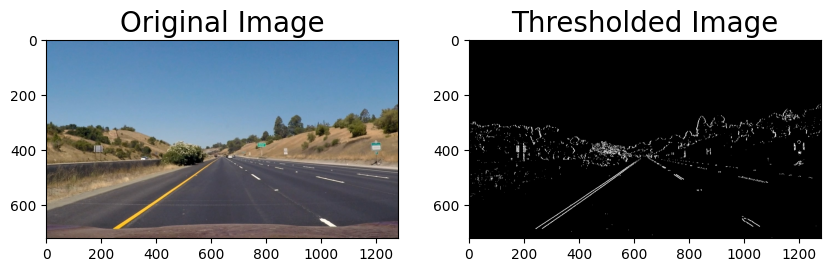

In [9]:
# Read image
img = mpimg.imread('test_images/straight_lines1.jpg')

thresholded = abs_sobel_thresh(img, orient='x', thresh_min=40, thresh_max=255)


f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=20)
plt.savefig('output_images/sobel_x', bbox_inches='tight')
plt.show()

Now, in the next step we will apply the threshold the combination of x and y gradients. The magnitude of the absolute gradient in the square root of the sum of the squares of the x and y gradiennts.


```python
abs_grad = np.sqrt(gradx**2 + grady**2)
```

In [10]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    # 3) Calculate the magnitude 
    mag = np.sqrt(sobelx**2+sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    mag = np.uint8(255*mag/np.max(mag))
    # 5) Create a binary mask where mag thresholds are met
    binary = np.zeros_like(mag)
    binary[(mag>=mag_thresh[0]) & (mag<=mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    # Remove this line
    return binary

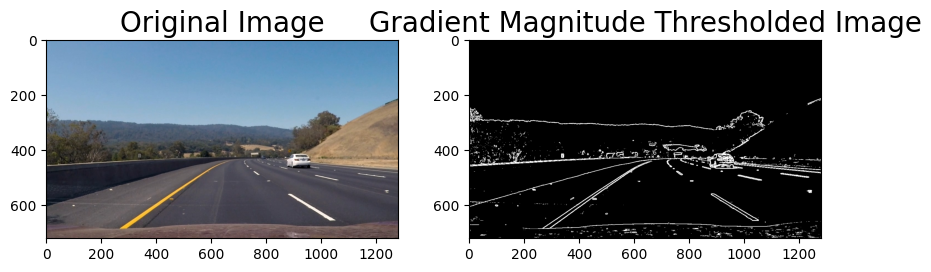

In [11]:
# Read image
img = mpimg.imread('test_images/test3.jpg')

thresholded = mag_thresh(img, sobel_kernel=3, mag_thresh=(30,255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Gradient Magnitude Thresholded Image', fontsize=20)
plt.show()

Now, we will find the direction of the threshold of the gradient. 

In [12]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    sobelx = np.absolute(sobelx)
    sobely = np.absolute(sobely)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction = np.arctan2(sobely, sobelx)
    
    # 5) Create a binary mask where direction thresholds are met
    binary = np.zeros_like(direction)
    
    # 6) Return this mask as your binary_output image
    binary[(direction>=thresh[0]) & (direction<=thresh[1])] = 1
    
    return binary

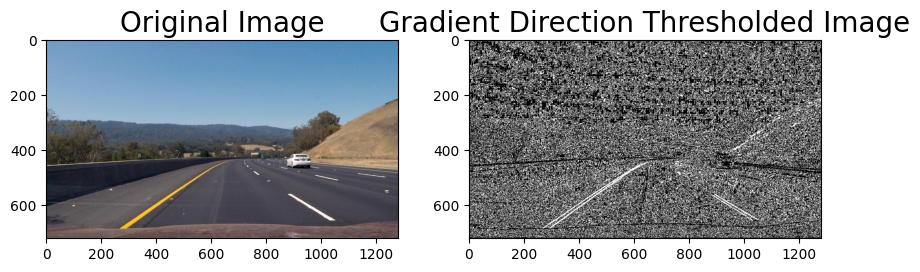

In [13]:
# Read image
img = mpimg.imread('test_images/test3.jpg')

thresholded = dir_threshold(img, sobel_kernel=3, thresh=(0.7, 1.3))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Gradient Direction Thresholded Image', fontsize=20)
plt.show()

Now, lets combine all of these to get a final resulting image of the road.

In [14]:
def apply_threshold(img):
    # X threshold
    gradx = abs_sobel_thresh(img, orient='x', thresh_min=30, thresh_max=100)
    
    # Y threshold
    grady = abs_sobel_thresh(img, orient='y', thresh_min=30, thresh_max=100)
    
    # Magnitude threshold
    mag = mag_thresh(img, sobel_kernel=9, mag_thresh=(30,100))
    
    # Direction threshold
    direction = dir_threshold(img, sobel_kernel=29, thresh=(0.7,1.3))
    
    # Combining All
    binary = np.zeros_like(direction)
    
    binary[((gradx == 1) & (grady == 1))|((mag == 1) & (direction == 1))] = 1
    
    return binary

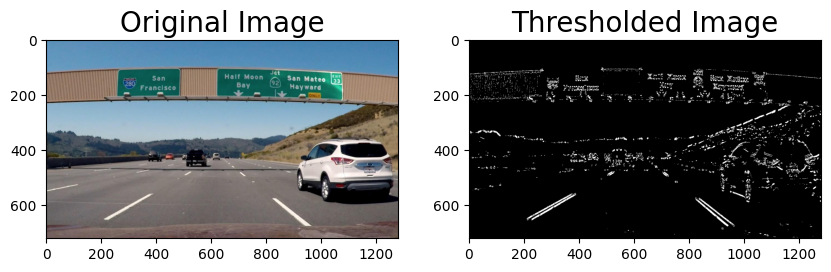

In [15]:
# Read image
img = mpimg.imread('img/test_image.png')

thresholded = apply_threshold(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=20)
plt.savefig('output_images/multiple_thresholds', bbox_inches='tight')
plt.show()

### Color Spaces

In this section we will try to take advantage of the color information in the image to find the lane lines.

**What is a color space?**

A color space is a specific organization of colors; color spaces provide a way to categorize colors and represent them in digital images.

**RGB Space:**

**RGB** is red-green-blue color space. You can think of this as a 3D space, in this case a cube, where any color can be represented by a 3D coordinate of R, G, and B values. For example, white has the coordinate (255, 255, 255), which has the maximum value for red, green, and blue.

<div class="img-with-text">
    <img src="https://d17h27t6h515a5.cloudfront.net/topher/2016/November/5834e496_screen-shot-2016-11-22-at-4.35.48-pm/screen-shot-2016-11-22-at-4.35.48-pm.png" alt="RGB" style="width: 300px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 20:</b><em> (RGB Space.
    )</em></p>
</div>

There are many other ways to represent the colors in an image besides just composed of red, green, and blue values.

There is also HSV color space (hue, saturation, and value), and HLS space (hue, lightness, and saturation). These are some of the most commonly used color spaces in image analysis.

To get some intuition about these color spaces, you can generally think of Hue as the value that represents color independent of any change in brightness. So if you imagine a basic red paint color, then add some white to it or some black to make that color lighter or darker -- the underlying color remains the same and the hue for all of these colors will be the same.

On the other hand, Lightness and Value represent different ways to measure the relative lightness or darkness of a color. For example, a dark red will have a similar hue but much lower value for lightness than a light red. Saturation also plays a part in this; saturation is a measurement of colorfulness. So, as colors get lighter and closer to white, they have a lower saturation value, whereas colors that are the most intense, like a bright primary color (imagine a bright red, blue, or yellow), have a high saturation value. You can get a better idea of these values by looking at the 3D color spaces pictured below.

Most of these different color spaces were either inspired by the human vision system, and/or developed for efficient use in television screen displays and computer graphics.

<div class="img-with-text">
    <img src="https://d17h27t6h515a5.cloudfront.net/topher/2016/November/5834e6ed_screen-shot-2016-11-22-at-4.44.32-pm/screen-shot-2016-11-22-at-4.44.32-pm.png" alt="HSV" style="width: 500px;" vspace=20/>
    <p style="text-align: center;"><b>Fig. 20:</b><em> (HSV and HLS Space.)</em></p>
</div>   

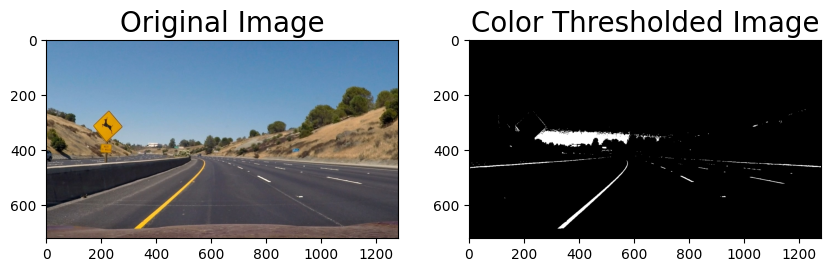

In [16]:
image = mpimg.imread('test_images/test2.jpg')
thresh = (180, 255)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Color Thresholded Image', fontsize=20)
plt.savefig('output_images/gray_thresholded', bbox_inches='tight')
plt.show()

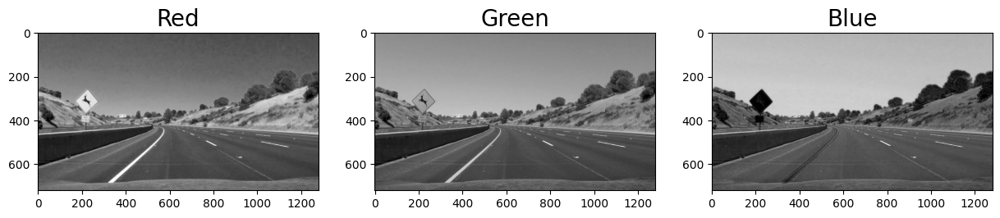

In [17]:
R = image[:,:,0]
G = image[:,:,1]
B = image[:,:,2]

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
ax1.imshow(R, cmap='gray')
ax1.set_title('Red', fontsize=20)
ax2.imshow(G, cmap='gray')
ax2.set_title('Green', fontsize=20)
ax3.imshow(B, cmap='gray')
ax3.set_title('Blue', fontsize=20)
plt.savefig('output_images/red_green_blue', bbox_inches='tight')
plt.show()

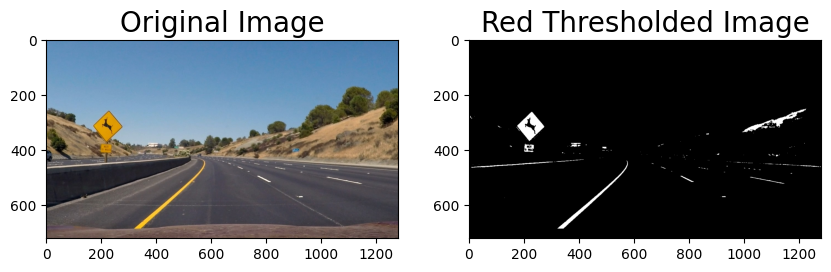

In [18]:
thresh = (200, 255)
binary = np.zeros_like(R)
binary[(R > thresh[0]) & (R <= thresh[1])] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Red Thresholded Image', fontsize=20)
plt.savefig('output_images/red_thresholded', bbox_inches='tight')
plt.show()

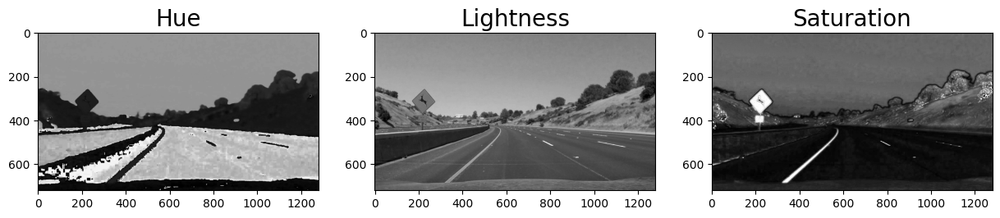

In [19]:
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
ax1.imshow(H, cmap='gray')
ax1.set_title('Hue', fontsize=20)
ax2.imshow(L, cmap='gray')
ax2.set_title('Lightness', fontsize=20)
ax3.imshow(S, cmap='gray')
ax3.set_title('Saturation', fontsize=20)
plt.savefig('output_images/hls', bbox_inches='tight')
plt.show()

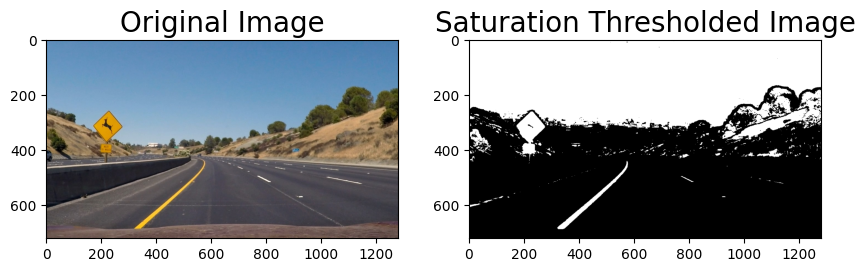

In [20]:
thresh = (90, 255)
binary = np.zeros_like(S)
binary[(S > thresh[0]) & (S <= thresh[1])] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Saturation Thresholded Image', fontsize=20)
plt.savefig('output_images/saturation_thresh', bbox_inches='tight')
plt.show()

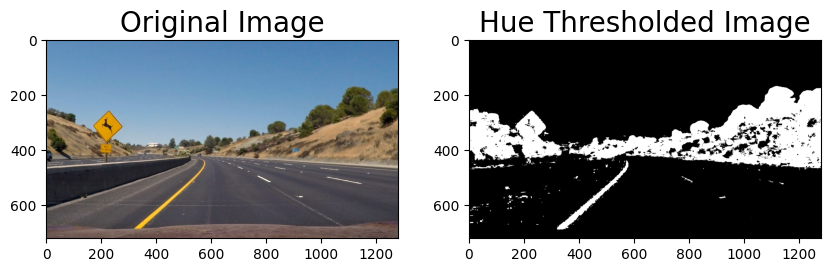

In [21]:
thresh = (15, 100)
binary = np.zeros_like(H)
binary[(H > thresh[0]) & (H <= thresh[1])] = 1

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(binary, cmap='gray')
ax2.set_title('Hue Thresholded Image', fontsize=20)
plt.savefig('output_images/hue_thresh', bbox_inches='tight')
plt.show()

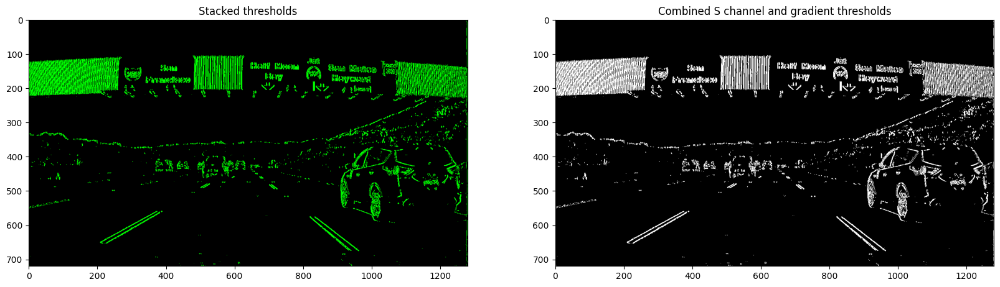

In [22]:
# Convert to HLS color space and separate the S channel
# Note: img is the undistorted image
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
s_channel = hls[:,:,2]

# Grayscale image
# NOTE: we already saw that standard grayscaling lost color information for the lane lines
# Explore gradients in other colors spaces / color channels to see what might work better
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Sobel x
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

# Threshold x gradient
thresh_min = 20
thresh_max = 100
sxbinary = np.zeros_like(scaled_sobel)
sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

# Threshold color channel
s_thresh_min = 170
s_thresh_max = 255
s_binary = np.zeros_like(s_channel)
s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))

# Combine the two binary thresholds
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(color_binary)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary, cmap='gray')
plt.savefig('output_images/combined_gradients', bbox_inches='tight')

So, now we have enough knowledge to complete the first steps of finding the lane lines:
* Camera Calibration
* Undistorting the image of the road
* Apply Gradient/Color thresholds to the image
* Apply Perspective transform to the image to get a top down view

### Functions

**`process_image(img, mtx, dst)`**: 

**Inputs:**
* img: Image that will be processed
* mtx: camera calibration matrix
* dist: camera distortion matrix

**Outputs:**
* img: processed image
* Minv Inverse warp matrix

In [23]:
def process_image(img, mtx, dist):
    img = undistort(img, mtx, dist)
    
    src = np.float32([
            [520.847, 450.627],
            [760.153, 450.627],
            [1016.4462, img.shape[0]],
            [263.5538, img.shape[0]]
        ])
    
    dst = np.float32([
            [0, 0],
            [1280, 0],
            [914.638, img.shape[0]],
            [365.362, img.shape[0]]
        ])
    
    img, Minv = warp(img, src, dst)
    
    return img, Minv

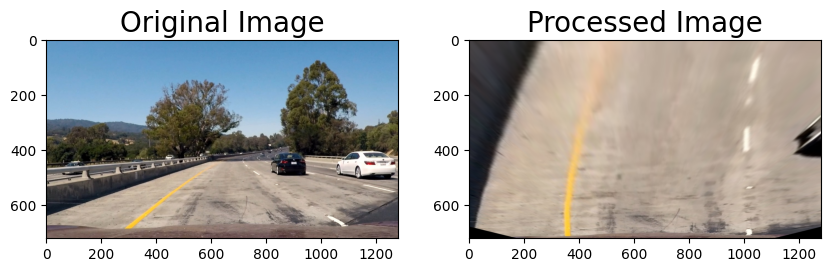

In [24]:
%matplotlib inline
img = mpimg.imread('test_images/test1.jpg')
processed, Minv = process_image(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(processed, cmap='gray')
ax2.set_title('Processed Image', fontsize=20)
plt.savefig('output_images/warp', bbox_inches='tight')
plt.show()

**```
get_rg_thresholded(img, r_thresh=(150,255), g_thresh=(150,255)):
```**

**Inputs:**
* img: input image
* r_thresh: Thresholds in the red color region
* g_thresh: Thresholds in the green color space

**Outputs:**
* b_rg: Red and Green Thresholded Image

In [25]:
def get_rg_thresholded(img, r_thresh=(150,255), g_thresh=(150,255)):
    # R
    r = img[:,:,0]
    #
    g = img[:,:,1]

    # Thresholded gray
    b_rg = np.zeros_like(gray)
    b_rg[((r>r_thresh[0])&(r<=r_thresh[1]))|((g>g_thresh[0])&(g<=g_thresh[1]))] = 1
    
    return b_rg

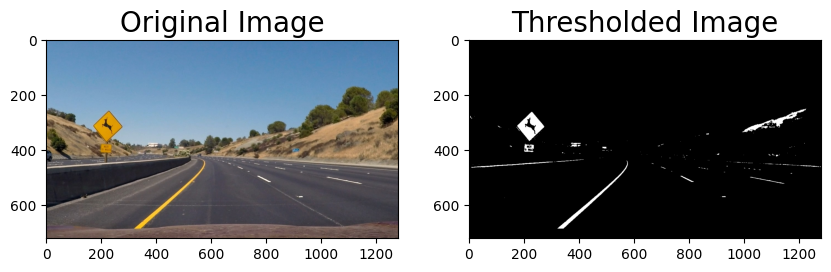

In [26]:
%matplotlib inline
img = mpimg.imread('test_images/test2.jpg')
rg_thresholded = get_rg_thresholded(img, r_thresh=(200,255), g_thresh=(200,255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(rg_thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=20)
plt.savefig('output_images/rg_thresh', bbox_inches='tight')
plt.show()

**`get_hs_thresholded(img, h_thresh=(0,40), s_thresh=(80,255), v_thresh=(200,255)):`**

**Inputs:**
* img: input image
* h_thresh: threshold in the h space
* s_thresh: threshold in the s space
* v_thresh: threshold in the v space

**Outputs:**
* b_hs: binary hsv thresholded image

In [27]:
def get_hs_thresholded(img, h_thresh=(0,40), s_thresh=(80,255), v_thresh=(200,255)):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    h=hsv[:,:,0]
    s=hsv[:,:,1]
    v=hsv[:,:,2]
    
    b_hs = np.zeros_like(h)
    b_hs[((h>h_thresh[0])&(h<=h_thresh[1]))&((s>s_thresh[0])&(s<=s_thresh[1]))&((v>v_thresh[0])&(v<=v_thresh[1]))] = 1
    return b_hs

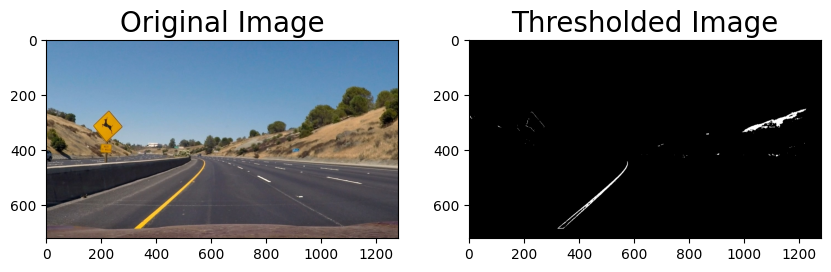

In [28]:
%matplotlib inline
img = mpimg.imread('test_images/test2.jpg')
hs_thresholded = get_hs_thresholded(img, h_thresh=(0,40), s_thresh=(80,200), v_thresh=(200,255))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(hs_thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=20)
plt.savefig('output_images/hs_thresh', bbox_inches='tight')
plt.show()

**`get_grad_thresh(img):`**

**Inputs:**
* img: input image

**Outputs:**
* b_grad: gradient thresholded image

In [29]:
def get_grad_thresh(img):
    sobel_kernel = 9
    
    mag_thresh_s = (20,20)
    mag_thresh_l = (20,20)
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    h = hls[:,:,0]
    l = hls[:,:,1]
    s = hls[:,:,2]
    
    sobelx_s = cv2.Sobel(s, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    sobely_s = cv2.Sobel(s, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
   
    mag_s = np.sqrt(sobelx_s**2+sobely_s**2)
    
    mag_s = np.uint8(255*mag_s/np.max(mag_s))
    
    
    sobelx_l = cv2.Sobel(l, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    sobely_l = cv2.Sobel(l, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
   
    mag_l = np.sqrt(sobelx_l**2+sobely_l**2)
    
    mag_l = np.uint8(255*mag_l/np.max(mag_l))
    
    binary = np.zeros_like(mag_s)
    binary[((mag_s>=mag_thresh_s[0]) & (mag_s<=mag_thresh_s[1]))|((mag_l>=mag_thresh_l[0])&(mag_l<=mag_thresh_l[1]))] = 1
    
    return binary
    
    grad_x = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=255)
    grad_m = mag_thresh(img, sobel_kernel=3, mag_thresh=(20,255))
    grad_d = dir_threshold(img, sobel_kernel=29, thresh=(0.7,1.3))
    
    b_grad = np.zeros_like(grad_x)
    b_grad[((grad_x==1)|(grad_m==1))] = 1
    
    return b_grad

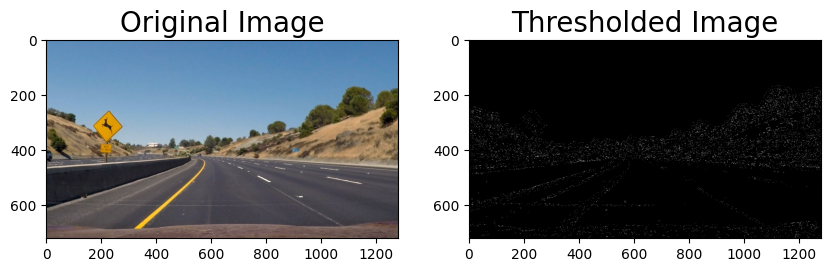

In [30]:
%matplotlib inline
img = mpimg.imread('test_images/test2.jpg')
grad_thresholded = get_grad_thresh(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_thresholded, cmap='gray')
ax2.set_title('Thresholded Image', fontsize=20)
plt.savefig('output_images/grad_thresh', bbox_inches='tight')
plt.show()

In [31]:
def get_lanes(img):
    b_hs_yellow = get_hs_thresholded(img=img, h_thresh=(0,40), s_thresh=(80,255), v_thresh=(200,255))
    b_hs_white = get_hs_thresholded(img=img,h_thresh=(0,255), s_thresh=(0,40), v_thresh=(220,255))
    
    b = np.zeros_like(b_hs_yellow)
    
    b_grad = get_grad_thresh(img)
    
    b[(b_hs_white == 1)|(b_hs_yellow == 1)|(b_grad == 1)] = 1
    
    return b

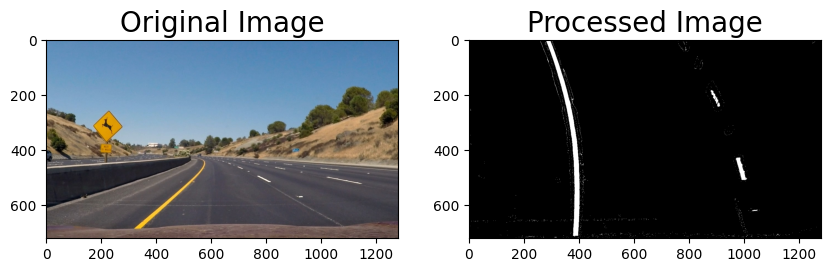

In [32]:
img = mpimg.imread('test_images/test2.jpg')
processed, Minv = process_image(img, mtx, dist)

lines = get_lanes(processed)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(lines, cmap='gray')
ax2.set_title('Processed Image', fontsize=20)
plt.savefig('output_images/binary_warped', bbox_inches='tight')
plt.show()

In [33]:
class lanefinder(object):
    
    def __init__(self):
        self.plot = False
    
    def should_plot(self, plot = False):
        self.frames_processed = 0
        self.plot = plot
        
    def apply_on_video(self, input_video = "project_video.mp4", output_video = "project_video_output.mp4", plot = False):
        self.plot = plot
        
        self.frames_processed = 0
        self.left_fit = None
        self.right_fit = None
        self.out_img = None
        
        # Import everything needed to edit/save/watch video clips
        from moviepy.editor import VideoFileClip
        from IPython.display import HTML

        set_prev = 0
        do_diagnosis = 1

        clip4 = VideoFileClip(input_video);
        white_clip = clip4.fl_image(self.apply_pipeline) #NOTE: this function expects color images!!
        %time white_clip.write_videofile(output_video, audio=False);
        
        HTML("""
        <video width="960" height="540" controls>
          <source src="{0}">
        </video>

        """.format(output_video))
        
    def apply_pipeline(self,img):
        global left_fit
        global right_fit
        global out_img
        
        '''Udistort Image'''
        img = undistort(img, mtx, dist)

        if(self.plot):
            f, ((ax11, ax12),(ax21, ax22)) = plt.subplots(2, 2, figsize=(12, 7))
            ax11.imshow(img)
            ax11.set_title('Undistorted Image', fontsize=20)

        '''Warp Image'''
        src = np.float32([
                [560.847, 445.627],
                [720.153, 445.627],
                [1016.4462, img.shape[0]],
                [263.5538, img.shape[0]]
            ])

        dst = np.float32([
                [0, 0],
                [1280, 0],
                [914.638, img.shape[0]],
                [365.362, img.shape[0]]
            ])

        warped, Minv = warp(img, src, dst)

        binary_warped = get_lanes(warped)
        
        if(self.plot):
            ax12.imshow(binary_warped, cmap='gray')
            ax12.set_title('Binary Image', fontsize = 20)
        
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

        if(self.frames_processed == 0):
            # Find Lines
            # Assuming you have created a warped binary image called "binary_warped"
            # Take a histogram of the bottom half of the image
            histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
            
            # Find the peak of the left and right halves of the histogram
            # These will be the starting point for the left and right lines
            midpoint = np.int(histogram.shape[0]/2)
            leftx_base = np.argmax(histogram[:midpoint])
            rightx_base = np.argmax(histogram[midpoint:]) + midpoint

            # Choose the number of sliding windows
            nwindows = 9
            # Set height of windows
            window_height = np.int(binary_warped.shape[0]/nwindows)
            # Identify the x and y positions of all nonzero pixels in the image
            nonzero = binary_warped.nonzero()
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
            # Current positions to be updated for each window
            leftx_current = leftx_base
            rightx_current = rightx_base
            # Set the width of the windows +/- margin
            margin = 100
            # Set minimum number of pixels found to recenter window
            minpix = 50
            # Create empty lists to receive left and right lane pixel indices
            left_lane_inds = []
            right_lane_inds = []

            # Step through the windows one by one
            for window in range(nwindows):
                # Identify window boundaries in x and y (and right and left)
                win_y_low = binary_warped.shape[0] - (window+1)*window_height
                win_y_high = binary_warped.shape[0] - window*window_height
                win_xleft_low = leftx_current - margin
                win_xleft_high = leftx_current + margin
                win_xright_low = rightx_current - margin
                win_xright_high = rightx_current + margin
                # Draw the windows on the visualization image
                cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
                cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
                # Identify the nonzero pixels in x and y within the window
                good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
                # Append these indices to the lists
                left_lane_inds.append(good_left_inds)
                right_lane_inds.append(good_right_inds)
                # If you found > minpix pixels, recenter next window on their mean position
                if len(good_left_inds) > minpix:
                    leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
                if len(good_right_inds) > minpix:        
                    rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

            # Concatenate the arrays of indices
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)

            # Extract left and right line pixel positions
            leftx = nonzerox[left_lane_inds]
            lefty = nonzeroy[left_lane_inds] 
            rightx = nonzerox[right_lane_inds]
            righty = nonzeroy[right_lane_inds] 

            # Fit a second order polynomial to each
            left_fit = np.polyfit(lefty, leftx, 2)
            right_fit = np.polyfit(righty, rightx, 2)

            # Generate x and y values for plotting
            ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        else:
            # Assume you now have a new warped binary image 
            # from the next frame of video (also called "binary_warped")
            # It's now much easier to find line pixels!
            nonzero = binary_warped.nonzero()
            nonzeroy = np.array(nonzero[0])
            nonzerox = np.array(nonzero[1])
            margin = 100
            left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
            right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

            # Again, extract left and right line pixel positions
            leftx = nonzerox[left_lane_inds]
            lefty = nonzeroy[left_lane_inds] 
            rightx = nonzerox[right_lane_inds]
            righty = nonzeroy[right_lane_inds]
            # Fit a second order polynomial to each
            left_fit = np.polyfit(lefty, leftx, 2)
            right_fit = np.polyfit(righty, rightx, 2)
            # Generate x and y values for plotting
            ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        if(self.plot):
            ax21.imshow(out_img)
            ax21.plot(left_fitx, ploty, color='yellow')
            ax21.plot(right_fitx, ploty, color='yellow')
            ax21.set_title('Polynomials', fontsize = 20)

        # Draw on Image
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
        
        # Combine the result with the original image
        result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
        
        y_eval = np.max(ploty)
        
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720.0 # meters per pixel in y dimension
        xm_per_pix = 3.7/700.0 # meters per pixel in x dimension
        
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
        right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
        
        left_pos = (left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2])
        right_pos = (right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2])
        
        lanes_mid = (left_pos+right_pos)/2.0
        
        distance_from_mid = binary_warped.shape[1]/2.0 - lanes_mid
        
        mid_dist_m = xm_per_pix*distance_from_mid
        
        curvature = 'Radius: '+ str(left_curverad) + ' m, ' + str(right_curverad) + " m"
        lane_dist = 'Distance From Road Center: '+str(mid_dist_m)+' m'
        font = cv2.FONT_HERSHEY_SIMPLEX
        result = cv2.putText(result,curvature,(25,50), font, 1, (255,255,255),2,cv2.LINE_AA)
        result = cv2.putText(result,lane_dist,(25,100), font, 1, (255,255,255),2,cv2.LINE_AA)

        if(self.plot):
            ax22.imshow(result)
            ax22.set_title('Processed Image', fontsize = 20)
            plt.savefig('output_images/pipeline', bbox_inches='tight')
            
        self.frames_processed = self.frames_processed + 1

        # Return
        return result

In [34]:
# img = mpimg.imread('test_images/test2.jpg')
# LF = lanefinder()
# LF.should_plot(True)
# result = LF.apply_pipeline(img)

In [35]:
# LF.apply_on_video(input_video='project_video.mp4', output_video='project_video_out.mp4')

In [36]:
# from IPython.display import HTML
# project_output = 'project_video_output.mp4'

# HTML("""
# <video width="960" height="540" controls>
#   <source src="{0}">
# </video>

# """.format("project_video_out.mp4"))

# Vehicle Detection and Tracking

In [37]:
'''Importing all needed modules'''

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog

# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn >= 0.18 use:
# from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label

C:\Users\shubh\AppData\Local\Temp\ipykernel_26752\269272511.py:17: DeprecationWarning: Please use `label` from the `scipy.ndimage` namespace, the `scipy.ndimage.measurements` namespace is deprecated.
  from scipy.ndimage.measurements import label


#### Loading and Organizing the data

All data is in the form of png images where each pixel can have a value between 0 and 1.

Your function returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: <class 'numpy.uint8'>


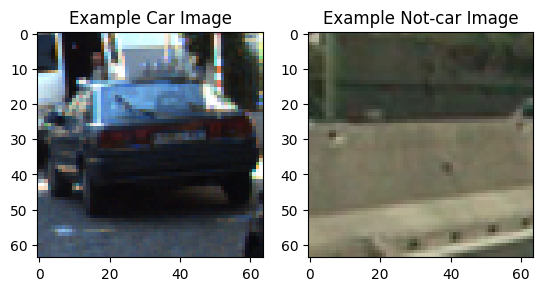

In [38]:
# images are divided up into vehicles and non-vehicles
import glob
non_vehicles_gti = glob.glob('Vehicle-Detection-Data/nonvehicles/GTI/*.png')
non_vehicles_extras = glob.glob('Vehicle-Detection-Data/nonvehicles/Extras/*.png')

vehicles_gti_far = glob.glob('Vehicle-Detection-Data/vehicles/GTI_Far/*.png')
vehicles_gti_left = glob.glob('Vehicle-Detection-Data/vehicles/GTI_Left/*.png')
vehicles_gti_right = glob.glob('Vehicle-Detection-Data/vehicles/GTI_Right/*.png')
vehicles_gti_middle = glob.glob('Vehicle-Detection-Data/vehicles/GTI_MiddleClose/*.png')
vehicles_kitti = glob.glob('Vehicle-Detection-Data/vehicles/KITTI_extracted/*.png')

notcars = np.concatenate((non_vehicles_gti, non_vehicles_extras))
cars = np.concatenate((vehicles_gti_far, vehicles_gti_left, vehicles_gti_right, vehicles_gti_middle, vehicles_kitti))
        
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    # Define a key "image_shape" and store the test image shape 3-tuple
    test_image = cv2.imread(car_list[0])
    data_dict["image_shape"] = test_image.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = type(test_image[0][0][0])
    # Return data_dict
    return data_dict
    
data_info = data_look(cars, notcars)

print('Your function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])
# Just for fun choose random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])


# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(car_image)
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(notcar_image)
plt.title('Example Not-car Image')
plt.savefig('output_images/car_no_car', bbox_inches='tight')
plt.show()

#### RGB Color 

One feature could be a histogram of the RGB values in an image

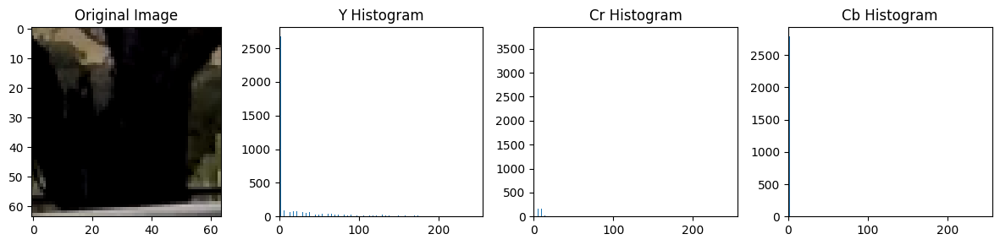

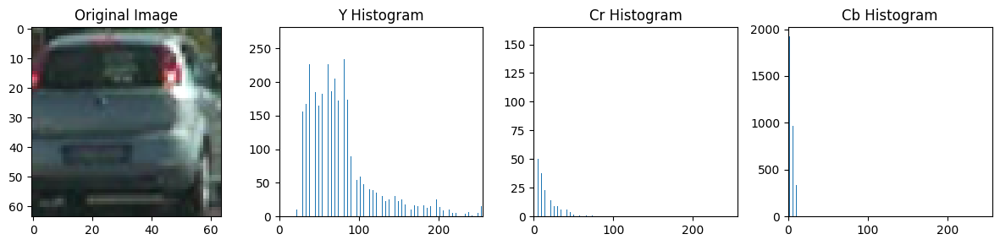

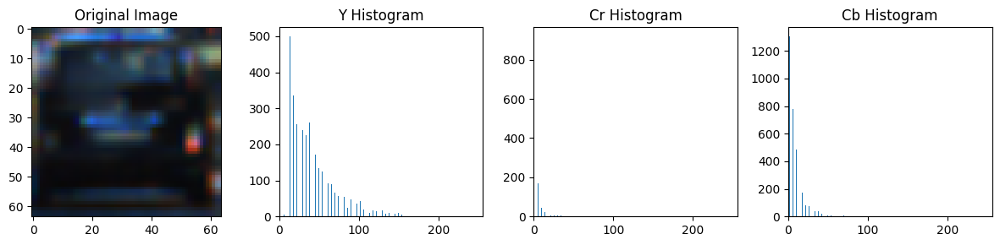

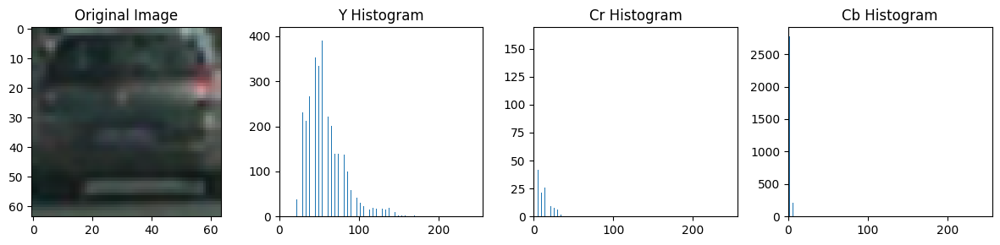

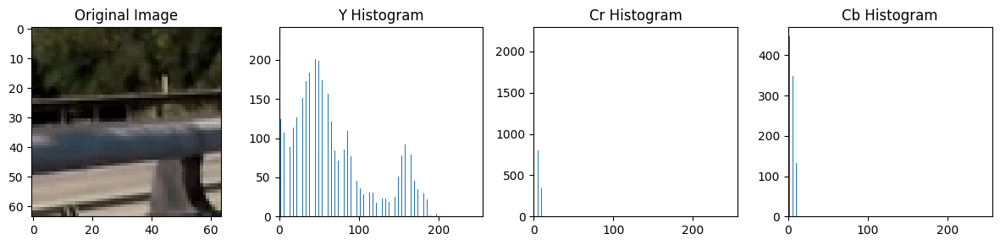

In [39]:
# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    
    # Compute the histogram of the RGB channels separately
    yhist = np.histogram(img[:,:,0], bins = nbins, range = bins_range)
    crhist = np.histogram(img[:,:,1], bins = nbins, range = bins_range)
    cbhist = np.histogram(img[:,:,2], bins = nbins, range = bins_range)
    
    # Generating bin centers
    bin_centers = (yhist[1][1:]  + yhist[1][0:len(yhist[1])-1])/2
    
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((yhist[0], crhist[0], cbhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return yhist, crhist, cbhist, bin_centers, hist_features
    


for i in range(0, 5):
    
    if(np.random.random()>0.5):
        car_ind = np.random.randint(0, len(cars))
        image = mpimg.imread(cars[car_ind])
    else:
        notcar_ind = np.random.randint(0, len(notcars))
        image = mpimg.imread(notcars[notcar_ind])
    
    image = image*255
    
    yh, crh, cbh, bincen, feature_vec = color_hist(image, nbins=64, bins_range=(0, 256))
    # Plot a figure with all three bar charts
    if yh is not None:
        fig = plt.figure(figsize=(12,3))
        plt.subplot(141)
        image = image/255
        plt.imshow(image)
        plt.title('Original Image')
        plt.subplot(142)
        plt.bar(bincen, yh[0])
        plt.xlim(0, 256)
        plt.title('Y Histogram')
        plt.subplot(143)
        plt.bar(bincen, crh[0])
        plt.xlim(0, 256)
        plt.title('Cr Histogram')
        plt.subplot(144)
        plt.bar(bincen, cbh[0])
        plt.xlim(0, 256)
        plt.title('Cb Histogram')
        fig.tight_layout()
        plt.savefig('output_images/histogram'+str(i), bbox_inches='tight')
        plt.show()
    else:
        print('Your function is returning None for at least one variable...')

#### Spacial Binning of features

A small resized version of the image which packages all of the spacial color data for us.

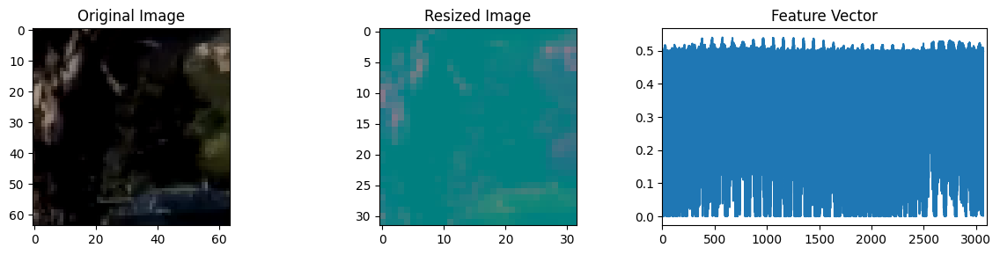

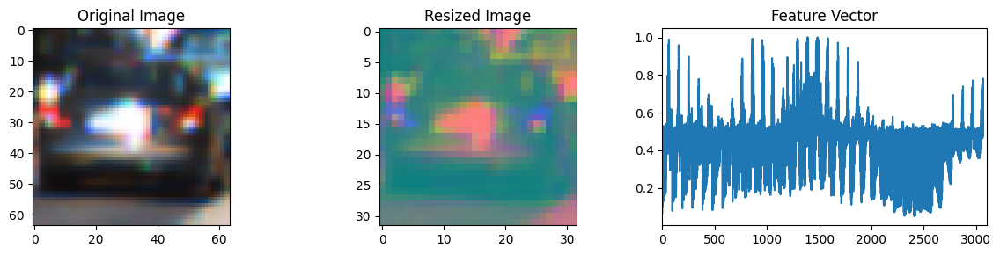

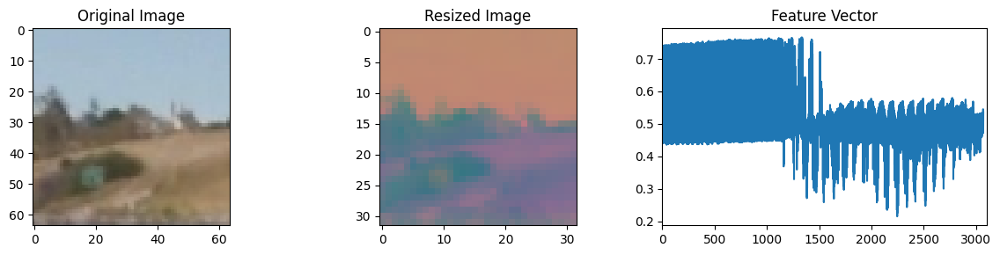

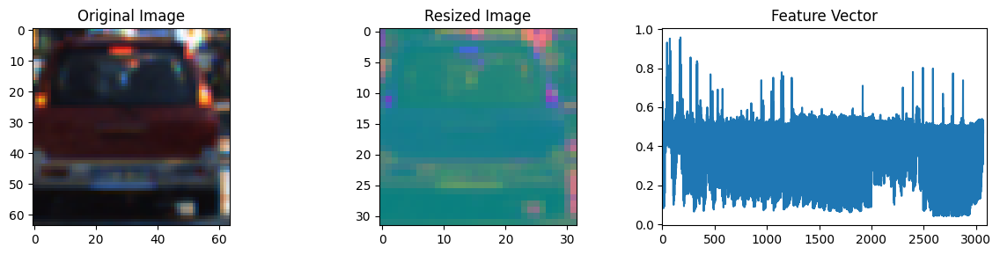

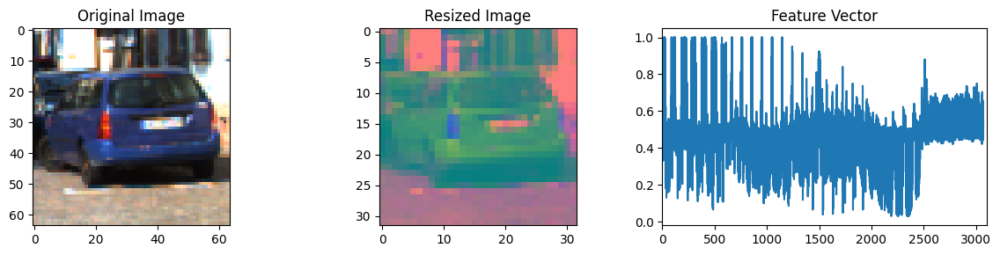

In [40]:
# Read in an image
# You can also read cutout2, 3, 4 etc. to see other examples
image = mpimg.imread(notcars[12])

# Define a function to compute color histogram features  
# Pass the color_space flag as 3-letter all caps string
# like 'HSV' or 'LUV' etc.
# KEEP IN MIND IF YOU DECIDE TO USE THIS FUNCTION LATER
# IN YOUR PROJECT THAT IF YOU READ THE IMAGE WITH 
# cv2.imread() INSTEAD YOU START WITH BGR COLOR!
def bin_spatial(img, color_space='RGB', size=(32, 32)):
    # Convert image to new color space (if specified)
    if(color_space == 'HSV'):
        img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    elif(color_space == 'LUV'):
        img = cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    elif(color_space == 'YCrCb'):
        img = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    
    img = cv2.resize(img, size)
    
    # Use cv2.resize().ravel() to create the feature vector
    features = img.ravel() # Remove this line!
    # Return the feature vector
    return features, img
    
for i in range(5):
    
    if(np.random.random()>0.5):
        car_ind = np.random.randint(0, len(cars))
        image = mpimg.imread(cars[car_ind])
    else:
        notcar_ind = np.random.randint(0, len(notcars))
        image = mpimg.imread(notcars[notcar_ind])
    
    feature_vec, resized = bin_spatial(image, color_space='YCrCb', size=(32, 32))


    fig = plt.figure(figsize=(12,3))
    plt.subplot(131)
    plt.imshow(image)
    plt.title('Original Image')
    plt.subplot(132)
    plt.imshow(resized)
    plt.title('Resized Image')
    plt.subplot(133)
    plt.plot(feature_vec)
    plt.xlim(0,3100)
    plt.title('Feature Vector')
    fig.tight_layout()
    plt.savefig('output_images/spatial_feat'+str(i), bbox_inches='tight')
    plt.show()

#### HOG Features

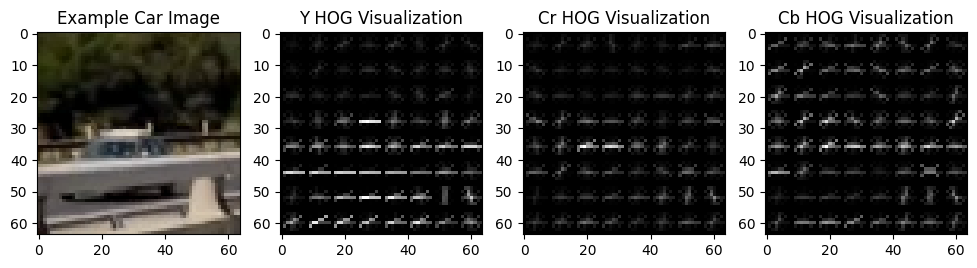

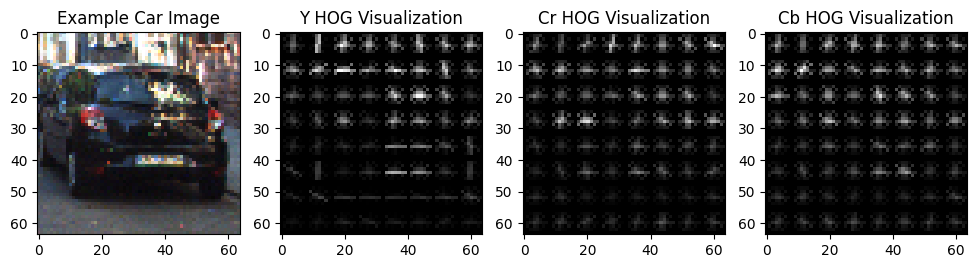

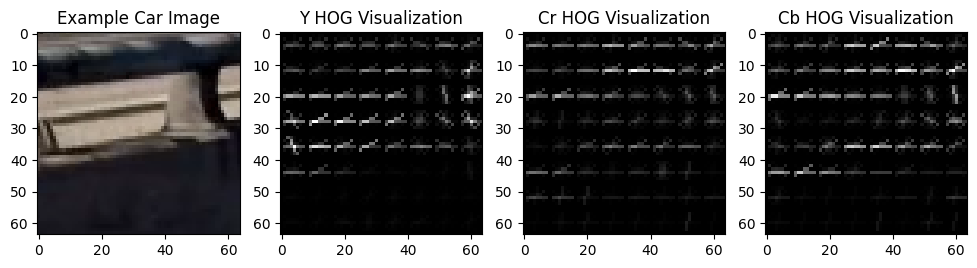

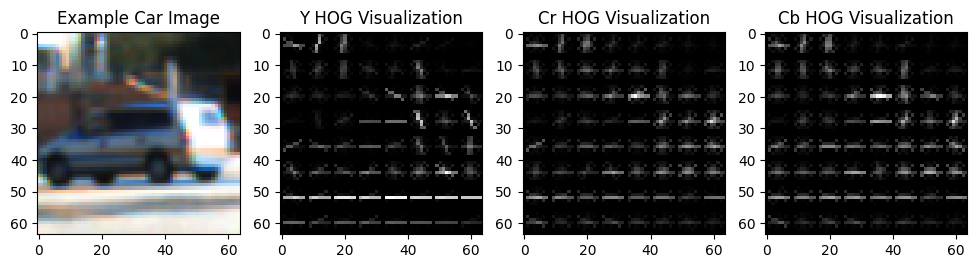

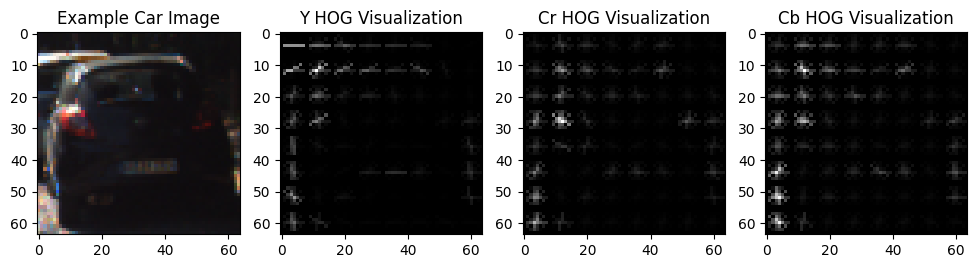

In [41]:
# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    if vis:
        # Use skimage.hog() to get both features and a visualization
        return hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                   cells_per_block=(cell_per_block, cell_per_block), visualize=vis, feature_vector=feature_vec)
    else:      
        # Use skimage.hog() to get features only
        return hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                   cells_per_block=(cell_per_block, cell_per_block), visualize=vis, feature_vector=feature_vec)

for i in range(5):
    
    if np.random.random() > 0.5:
        car_ind = np.random.randint(0, len(cars))
        image = mpimg.imread(cars[car_ind])
    else:
        notcar_ind = np.random.randint(0, len(notcars))
        image = mpimg.imread(notcars[notcar_ind])
    
    img_ycrcb = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    
    # Define HOG parameters
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    
    # Call our function with vis=True to see an image output
    y_features, y_hog_image = get_hog_features(img_ycrcb[:,:,0], orient, 
                            pix_per_cell, cell_per_block, 
                            vis=True, feature_vec=False)
    
    cr_features, cr_hog_image = get_hog_features(img_ycrcb[:,:,1], orient, 
                            pix_per_cell, cell_per_block, 
                            vis=True, feature_vec=False)
    
    cb_features, cb_hog_image = get_hog_features(img_ycrcb[:,:,2], orient, 
                            pix_per_cell, cell_per_block, 
                            vis=True, feature_vec=False)

    # Plot the examples
    fig = plt.figure(figsize=(12,3))
    plt.subplot(141)
    plt.imshow(image, cmap='gray')
    plt.title('Example Car Image')
    plt.subplot(142)
    plt.imshow(y_hog_image, cmap='gray')
    plt.title('Y HOG Visualization')
    plt.subplot(143)
    plt.imshow(cr_hog_image, cmap='gray')
    plt.title('Cr HOG Visualization')
    plt.subplot(144)
    plt.imshow(cb_hog_image, cmap='gray')
    plt.title('Cb HOG Visualization')
    plt.savefig('output_images/hog_feat'+str(i), bbox_inches='tight')
    plt.show()



**All Helper Functions**

In [57]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
# def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
#     # Make a copy of the image
#     imcopy = np.copy(img)
#     # Iterate through the bounding boxes
#     for bbox in bboxes:
#         # Draw a rectangle given bbox coordinates
#         cv2.rectangle(imcopy, (bbox[0][0], bbox[0][1]), (bbox[1][0],bbox[1][1]), color, thick)
#     # Return the image copy with boxes drawn
#     return imcopy
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    if bboxes is not None:  # Check if bboxes is not None
        imcopy = np.copy(img)
        # Iterate through the bounding boxes
        for bbox in bboxes:
            # Draw a rectangle given bbox coordinates
            cv2.rectangle(imcopy, (bbox[0][0], bbox[0][1]), (bbox[1][0], bbox[1][1]), color, thick)
        return imcopy
    else:
        return img  # Return the original image if bboxes is None

def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'RGB2HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if conv == 'RGB2HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualize=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualize=vis, feature_vector=feature_vec)
        return features

def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))
                        
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

**Get a trained SVM model for detecting Cars**

In [58]:
def get_trained_model(cars, notcars, color_space, orient, pix_per_cell, cell_per_block, hog_channel, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat, test_size = 0.2):
    car_features = extract_features(cars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    notcar_features = extract_features(notcars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    print(X[0].shape)
    scaled_X = X_scaler.transform(X)

    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(
        scaled_X, y, test_size=0.2, random_state=rand_state)

    print('Using:',orient,'orientations',pix_per_cell,
        'pixels per cell and', cell_per_block,'cells per block')
    print('Feature vector length:', len(X_train[0]))
    # Use a linear SVC 
    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    # Check the prediction time for a single sample
    t=time.time()
    
    return svc, X_scaler

**Finding Cars on the given scale and vertical bounds**

In [136]:
def find_cars(img, ystart, ystop, color_space, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat):
    
    img = img.astype(np.float32)/255
    
    conv = 'RGB2' + color_space
    ystart = int(ystart)
    ystop = int(ystop)

    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv=conv)
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (int(imshape[1]//scale), int(imshape[0]//scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    if(hog_feat == True):
        # Compute individual channel HOG features for the entire image
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

    bbox_list = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            if(hog_feat == True):
                # Extract HOG for this patch
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))


            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            if(spatial_feat == True):
                # Get color features
                spatial_features = bin_spatial(subimg, size=spatial_size)
            
            if(hist_feat == True):
                hist_features = color_hist(subimg, nbins=hist_bins)
            
            if(spatial_feat == True and hist_feat == True and hog_feat == True):
                stacked = np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)
            elif(spatial_feat == True and hist_feat == True and hog_feat == False):
                stacked = np.hstack((spatial_features, hist_features)).reshape(1, -1)
            elif(spatial_feat == False and hist_feat == True and hog_feat == True):
                stacked = np.hstack((hist_features, hog_features)).reshape(1, -1)
            elif(spatial_feat == False and hist_feat == False and hog_feat == True):
                stacked = np.hstack((hog_features)).reshape(1, -1)
                
            # Scale features and make a prediction
            test_features = X_scaler.transform(stacked)    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = int(xleft*scale)
                ytop_draw = int(ytop*scale)
                win_draw = int(window*scale)
                bbox_list.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return bbox_list

**Function for showing all the possible bounding boxes for given range of scales**

In [137]:
def search_windows(img, min_scale, max_scale, no_of_scales, pix_per_cell, cell_per_block):
    
    img = img.astype(np.float32)/255
    conv = 'RGB2YCrCb'
    
    scales = np.arange(min_scale, max_scale, ((max_scale-min_scale)/no_of_scales))
    y_start_stops = []
    for scale in scales:
        y_start_stops.append([400, 400+1.5*scale*64])
    
    bbox_list = []
    
    for scale, y_start_stop in zip(scales, y_start_stops):
        ystart = int(round(y_start_stop[0]))
        ystop = int(round(y_start_stop[1]))
        print("ystart:", ystart, "ystop:", ystop)


        img_tosearch = img[ystart:ystop,:,:]
        ctrans_tosearch = convert_color(img_tosearch, conv=conv)
        if scale != 1:
            imshape = ctrans_tosearch.shape
            ctrans_tosearch = cv2.resize(ctrans_tosearch, (int(imshape[1]/scale),int(imshape[0]/scale)))

        ch1 = ctrans_tosearch[:,:,0]

        # Define blocks and steps as above
        nxblocks = (ch1.shape[1] // pix_per_cell)-1
        nyblocks = (ch1.shape[0] // pix_per_cell)-1 
        nfeat_per_block = orient*cell_per_block**2
        # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
        window = 64
        nblocks_per_window = (window // pix_per_cell)-1 
        cells_per_step = 2  # Instead of overlap, define how many cells to step
        nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
        nysteps = (nyblocks - nblocks_per_window) // cells_per_step

        for xb in range(nxsteps):
            for yb in range(nysteps):
                ypos = yb*cells_per_step
                xpos = xb*cells_per_step

                xleft = xpos*pix_per_cell
                ytop = ypos*pix_per_cell
                
                xbox_left = int(xleft*scale)
                ytop_draw = int(ytop*scale)
                win_draw = int(window*scale)
                bbox_list.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))

    return bbox_list

**Showing all the possible bounding boxes**

ystart: 400 ystop: 496
ystart: 400 ystop: 508
ystart: 400 ystop: 520
ystart: 400 ystop: 532
ystart: 400 ystop: 544
ystart: 400 ystop: 556
ystart: 400 ystop: 568
ystart: 400 ystop: 580
ystart: 400 ystop: 592
ystart: 400 ystop: 604
ystart: 400 ystop: 616
ystart: 400 ystop: 628


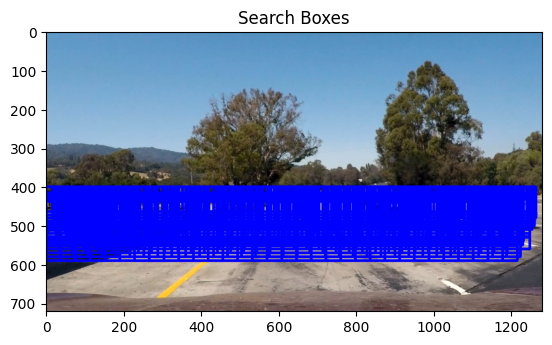

In [138]:
image = mpimg.imread('test_images/test1.jpg')
boxes = search_windows(image, min_scale=1.0, max_scale=2.5, no_of_scales=12, pix_per_cell=8, cell_per_block=2)
image = draw_boxes(image, boxes)
plt.imshow(image)
plt.title('Search Boxes')
plt.savefig('output_images/search_boxes', bbox_inches='tight')
plt.show()

**Heatmap Functions**

In [139]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

**Lane and Vehicle Finding Pipeline**

In [140]:
class lane_and_vehicle_finder(object):
    
    def __init__(self, svc, X_scaler, min_scale, max_scale, no_of_scales, color_space, orient, pix_per_cell, cell_per_block, hog_channel, spatial_size, hist_bins, spatial_feat, hist_feat, hog_feat, heat_thresh):
        self.plot = False
        self.svc = svc
        self.X_scaler = X_scaler
        
        # declare global variables needed frame to frame
        self.heatmaps = []
        self.heatmap_sum = np.zeros((720,1280)).astype(np.float64)
        
    
        self.min_scale = min_scale # minimum scale on which scanning takes place
        self.max_scale = max_scale # maximum scale on which scanning takes place
        self.no_of_scales = no_of_scales # Number of Scales on which scanning takes place
        self.color_space = color_space # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
        self.orient = orient # HOG orientations
        self.pix_per_cell = pix_per_cell # HOG pixels per cell
        self.cell_per_block = cell_per_block # HOG cells per block
        self.hog_channel = hog_channel # Can be 0, 1, 2, or "ALL"
        self.spatial_size = spatial_size # Spatial binning dimensions
        self.hist_bins = hist_bins    # Number of histogram bins
        self.spatial_feat = spatial_feat # Spatial features on or off
        self.hist_feat = hist_feat # Histogram features on or off
        self.hog_feat = hog_feat # HOG features on or off
        self.heat_thresh = heat_thresh # Amount of heat needed for positive
        
        self.scales = np.arange(self.min_scale, self.max_scale, ((self.max_scale-self.min_scale)/self.no_of_scales))
        self.y_start_stops = []
        for scale in self.scales:
            self.y_start_stops.append([400, 400+1.5*scale*64])
        
        self.mode = 'lanes_and_vehicles'
       
    def should_plot(self, plot = False):
        self.frames_processed = 0
        self.plot = plot
    
    def clear(self):
        self.heatmaps = []
        self.heatmap_sum = np.zeros((720,1280)).astype(np.float64)
    
    def set_mode(self, mode="lanes_and_vehicles"):
        self.mode = mode
        
    def apply_on_video(self, input_video = "project_video.mp4", output_video = "project_video_output.mp4", plot = False):
        self.plot = plot
        
        self.frames_processed = 0
        self.left_fit = None
        self.right_fit = None
        self.out_img = None
        
        # Import everything needed to edit/save/watch video clips
        from moviepy.editor import VideoFileClip
        from IPython.display import HTML

        set_prev = 0
        do_diagnosis = 1

        clip4 = VideoFileClip(input_video);
        white_clip = clip4.fl_image(self.apply_pipeline) #NOTE: this function expects color images!!
        %time white_clip.write_videofile(output_video, audio=False);
        
        HTML("""
        <video width="960" height="540" controls>
          <source src="{0}">
        </video>

        """.format(output_video))
        
    def apply_pipeline(self,img):
        global left_fit
        global right_fit
        global out_img
        
        '''Udistort Image'''
        img = undistort(img, mtx, dist)
        original = img
        
        heatmap_current = np.zeros_like(img[:,:,0]).astype(float)
        
        if(self.mode == 'lanes_and_vehicles' or self.mode == 'lanes'):
            if(self.plot):
                f, ((ax11, ax12),(ax21, ax22)) = plt.subplots(2, 2, figsize=(12, 7))
                ax11.imshow(img)
                ax11.set_title('Undistorted Image', fontsize=20)

            '''Warp Image'''
            src = np.float32([
                    [560.847, 445.627],
                    [720.153, 445.627],
                    [1016.4462, img.shape[0]],
                    [263.5538, img.shape[0]]
                ])

            dst = np.float32([
                    [0, 0],
                    [1280, 0],
                    [914.638, img.shape[0]],
                    [365.362, img.shape[0]]
                ])

            warped, Minv = warp(img, src, dst)

            binary_warped = get_lanes(warped)

            if(self.plot):
                ax12.imshow(binary_warped, cmap='gray')
                ax12.set_title('Binary Image', fontsize = 20)

            # Create an output image to draw on and  visualize the result
            out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

            if(self.frames_processed == 0):
                # Find Lines
                # Assuming you have created a warped binary image called "binary_warped"
                # Take a histogram of the bottom half of the image
                histogram = sum(binary_warped[binary_warped.shape[0]//2:,:])

                # Find the peak of the left and right halves of the histogram
                # These will be the starting point for the left and right lines
                midpoint = int(histogram.shape[0]//2)
                leftx_base = np.argmax(histogram[:midpoint])
                rightx_base = np.argmax(histogram[midpoint:]) + midpoint

                # Choose the number of sliding windows
                nwindows = 9
                # Set height of windows
                window_height = int(binary_warped.shape[0]//nwindows)
                # Identify the x and y positions of all nonzero pixels in the image
                nonzero = binary_warped.nonzero()
                nonzeroy = np.array(nonzero[0])
                nonzerox = np.array(nonzero[1])
                # Current positions to be updated for each window
                leftx_current = leftx_base
                rightx_current = rightx_base
                # Set the width of the windows +/- margin
                margin = 100
                # Set minimum number of pixels found to recenter window
                minpix = 50
                # Create empty lists to receive left and right lane pixel indices
                left_lane_inds = []
                right_lane_inds = []

                # Step through the windows one by one
                for window in range(nwindows):
                    # Identify window boundaries in x and y (and right and left)
                    win_y_low = binary_warped.shape[0] - (window+1)*window_height
                    win_y_high = binary_warped.shape[0] - window*window_height
                    win_xleft_low = leftx_current - margin
                    win_xleft_high = leftx_current + margin
                    win_xright_low = rightx_current - margin
                    win_xright_high = rightx_current + margin
                    # Draw the windows on the visualization image
                    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
                    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
                    # Identify the nonzero pixels in x and y within the window
                    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
                    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
                    # Append these indices to the lists
                    left_lane_inds.append(good_left_inds)
                    right_lane_inds.append(good_right_inds)
                    # If you found > minpix pixels, recenter next window on their mean position
                    if len(good_left_inds) > minpix:
                        leftx_current = int(np.mean(nonzerox[good_left_inds]))
                    if len(good_right_inds) > minpix:        
                        rightx_current = int(np.mean(nonzerox[good_right_inds]))

                # Concatenate the arrays of indices
                left_lane_inds = np.concatenate(left_lane_inds)
                right_lane_inds = np.concatenate(right_lane_inds)

                # Extract left and right line pixel positions
                leftx = nonzerox[left_lane_inds]
                lefty = nonzeroy[left_lane_inds] 
                rightx = nonzerox[right_lane_inds]
                righty = nonzeroy[right_lane_inds] 

                # Fit a second order polynomial to each
                left_fit = np.polyfit(lefty, leftx, 2)
                right_fit = np.polyfit(righty, rightx, 2)

                # Generate x and y values for plotting
                ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
                left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
                right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
            else:
                # Assume you now have a new warped binary image 
                # from the next frame of video (also called "binary_warped")
                # It's now much easier to find line pixels!
                nonzero = binary_warped.nonzero()
                nonzeroy = np.array(nonzero[0])
                nonzerox = np.array(nonzero[1])
                margin = 100
                left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
                right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

                # Again, extract left and right line pixel positions
                leftx = nonzerox[left_lane_inds]
                lefty = nonzeroy[left_lane_inds] 
                rightx = nonzerox[right_lane_inds]
                righty = nonzeroy[right_lane_inds]
                # Fit a second order polynomial to each
                left_fit = np.polyfit(lefty, leftx, 2)
                right_fit = np.polyfit(righty, rightx, 2)
                # Generate x and y values for plotting
                ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
                left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
                right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

            out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
            out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

            if(self.plot):
                ax21.imshow(out_img)
                ax21.plot(left_fitx, ploty, color='yellow')
                ax21.plot(right_fitx, ploty, color='yellow')
                ax21.set_title('Polynomials', fontsize = 20)

            # Draw on Image
            # Create an image to draw the lines on
            warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
            color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

            # Recast the x and y points into usable format for cv2.fillPoly()
            pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
            pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
            pts = np.hstack((pts_left, pts_right))

            # Draw the lane onto the warped blank image
            cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

            # Warp the blank back to original image space using inverse perspective matrix (Minv)
            newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 

            # Combine the result with the original image
            result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)

            y_eval = np.max(ploty)

            # Define conversions in x and y from pixels space to meters
            ym_per_pix = 30/720.0 # meters per pixel in y dimension
            xm_per_pix = 3.7/700.0 # meters per pixel in x dimension

            # Calculate the new radii of curvature
            left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
            right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])

            left_pos = (left_fit[0]*y_eval**2 + left_fit[1]*y_eval + left_fit[2])
            right_pos = (right_fit[0]*y_eval**2 + right_fit[1]*y_eval + right_fit[2])

            lanes_mid = (left_pos+right_pos)/2.0

            distance_from_mid = binary_warped.shape[1]/2.0 - lanes_mid

            mid_dist_m = xm_per_pix*distance_from_mid

            curvature = 'Radius: '+ str(left_curverad) + ' m, ' + str(right_curverad) + " m"
            lane_dist = 'Distance From Road Center: '+str(mid_dist_m)+' m'
            font = cv2.FONT_HERSHEY_SIMPLEX
            result = cv2.putText(result,curvature,(25,50), font, 1, (255,255,255),2,cv2.LINE_AA)
            result = cv2.putText(result,lane_dist,(25,100), font, 1, (255,255,255),2,cv2.LINE_AA)

            if(self.plot):
                ax22.imshow(result)
                ax22.set_title('Processed Image', fontsize = 20)
                plt.savefig('output_images/pipeline', bbox_inches='tight')

            self.frames_processed = self.frames_processed + 1
        else:
            result = original

        
        if(self.mode == 'vehicles' or self.mode == 'lanes_and_vehicles' or self.mode == 'heat' or self.mode == 'heat_thresh' or self.mode == 'boxes'):
            bbox_list = []

            # Finding Vehicles on all scales
            for scale, y_start_stop in zip(self.scales, self.y_start_stops):
                boxes = find_cars(original, y_start_stop[0], y_start_stop[1], self.color_space, scale, self.svc, self.X_scaler, self.orient, self.pix_per_cell, self.cell_per_block, self.spatial_size, self.hist_bins, self.spatial_feat, self.hist_feat, self.hog_feat)
                if not boxes == None:
                    if not len(boxes) == 0:
                        bbox_list.append(boxes)
            
            # Making a single list from all the detections
            if(not len(bbox_list) == 0):
                bbox_list = np.concatenate(bbox_list)
            
            # If making video showing bounding boxes
            if(self.mode == 'boxes'):
                #print(bbox_list)
                return draw_boxes(result, bbox_list)
            
            # Apply threshold to help remove false positives
            heatmap_current = add_heat(heatmap_current, bbox_list)

            self.heatmap_sum = self.heatmap_sum + heatmap_current
            self.heatmaps.append(heatmap_current)

            # subtract off old heat map to keep running sum of last 18 heatmaps
            if len(self.heatmaps)>18:
                old_heatmap = self.heatmaps.pop(0)
                self.heatmap_sum -= old_heatmap
                self.heatmap_sum = np.clip(self.heatmap_sum,0.0,1000000.0)

            # If making heatmap video
            if(self.mode == 'heat'):
                heatmapsum = np.clip(self.heatmap_sum, 0.0, 255.0)
                heatmapsum = np.array(heatmapsum, dtype=np.uint8)
                return cv2.cvtColor(heatmapsum, cv2.COLOR_GRAY2RGB)
            
            thresh_heat = apply_threshold(self.heatmap_sum, self.heat_thresh)
            
            # If making thresholded heatmap video
            if(self.mode == 'heat_thresh'):
                heatmapsum = np.clip(thresh_heat, 0.0, 255.0)
                heatmapsum = np.array(heatmapsum, dtype=np.uint8)
                return cv2.cvtColor(heatmapsum, cv2.COLOR_GRAY2RGB)
            
            labels = label(thresh_heat)

            result = draw_labeled_bboxes(result, labels)

        # Return
        return result

In [141]:
### TODO: Tweak these parameters and see how the results change.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 64    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

In [142]:
import pickle
# svc, X_scaler = get_trained_model(cars, notcars, color_space = color_space, orient = orient, pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, hog_channel = hog_channel, spatial_size = spatial_size, hist_bins = hist_bins, spatial_feat = spatial_feat, hist_feat = hist_feat, hog_feat = hog_feat, test_size = 0.2)

# # Saving svc and X_Scalar
# with open('svm_model.pickle', 'wb') as f: 
#     pickle.dump([svc, X_scaler], f)

In [143]:
# Recover svc and X_scalar
with open('svm_model.pickle', 'rb') as f:  
    svc, X_scaler = pickle.load(f)

**Applying model on Test Image**

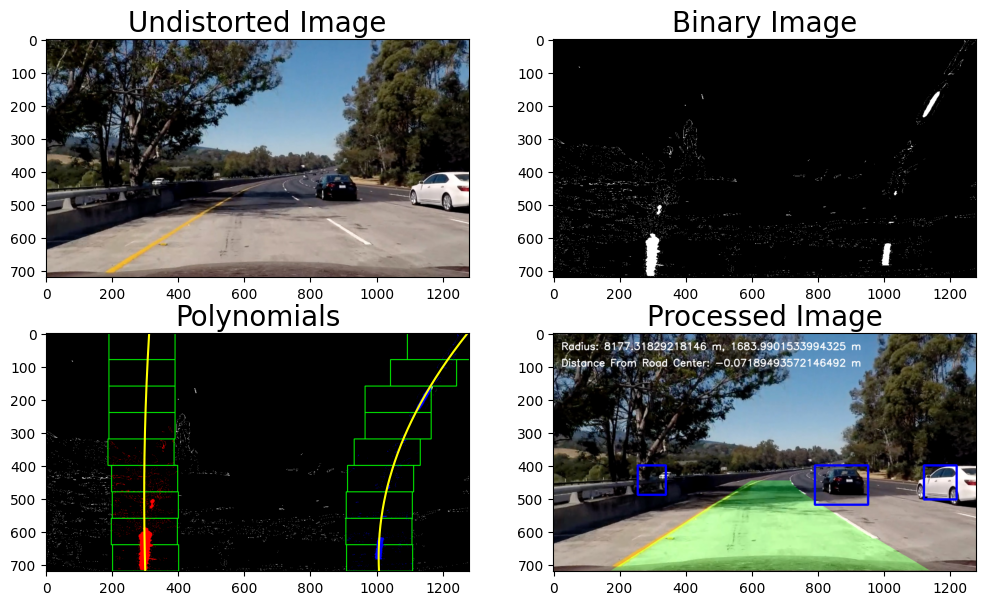

In [144]:
heat_thresh = 9 # Amount of heat needed for detection
LF = lane_and_vehicle_finder(svc = svc, X_scaler = X_scaler, min_scale = 1.0, max_scale = 2.5, no_of_scales = 12, color_space = color_space, orient = orient, pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, hog_channel = hog_channel, spatial_size = spatial_size, hist_bins = hist_bins, spatial_feat = spatial_feat, hist_feat = hist_feat, hog_feat = hog_feat, heat_thresh = heat_thresh)
LF.should_plot(True)
image = mpimg.imread('test_images/test5.jpg')
result = LF.apply_pipeline(image)
plt.imshow(result)
plt.show()

In [145]:
heat_thresh = 9 # Amount of heat needed for detection
LF = lane_and_vehicle_finder(svc = svc, X_scaler = X_scaler, min_scale = 1.0, max_scale = 2.5, no_of_scales = 12, color_space = color_space, orient = orient, pix_per_cell = pix_per_cell, cell_per_block = cell_per_block, hog_channel = hog_channel, spatial_size = spatial_size, hist_bins = hist_bins, spatial_feat = spatial_feat, hist_feat = hist_feat, hog_feat = hog_feat, heat_thresh = heat_thresh)

**Finding Bounding Boxes that have Vehicles Detections**

In [146]:
LF.set_mode(mode = 'boxes')
LF.apply_on_video(input_video='test_video.mp4', output_video='test_boxes_video_out.mp4')

Moviepy - Building video test_boxes_video_out.mp4.
Moviepy - Writing video test_boxes_video_out.mp4



Moviepy - Done !
Moviepy - video ready test_boxes_video_out.mp4
CPU times: total: 57.8 s
Wall time: 2min 26s


**Heatmap of all vehicle detections**

In [147]:
LF.clear()
LF.set_mode(mode = 'heat')
LF.apply_on_video(input_video='test_video.mp4', output_video='test_heat_video_out.mp4')

Moviepy - Building video test_heat_video_out.mp4.
Moviepy - Writing video test_heat_video_out.mp4



Moviepy - Done !
Moviepy - video ready test_heat_video_out.mp4
CPU times: total: 1min 5s
Wall time: 2min 20s


**Tresholded Heatmap of Vehicle Detections_(Thresholded at a minimum of 9 detections)_**

In [148]:
LF.clear()
LF.set_mode(mode = 'heat_thresh')
LF.apply_on_video(input_video='test_video.mp4', output_video='test_heat_thresh_video_out.mp4')

Moviepy - Building video test_heat_thresh_video_out.mp4.
Moviepy - Writing video test_heat_thresh_video_out.mp4



Moviepy - Done !
Moviepy - video ready test_heat_thresh_video_out.mp4
CPU times: total: 1min 9s
Wall time: 2min 38s


**Lane and Vehicle Detection Model Applyed on Short Test Video**

In [149]:
LF.clear()
LF.set_mode(mode = 'lanes_and_vehicles')
LF.apply_on_video(input_video='test_video.mp4', output_video='test_lanes_and_vehicles_video_out.mp4')

Moviepy - Building video test_lanes_and_vehicles_video_out.mp4.
Moviepy - Writing video test_lanes_and_vehicles_video_out.mp4



Moviepy - Done !
Moviepy - video ready test_lanes_and_vehicles_video_out.mp4
CPU times: total: 1min 7s
Wall time: 2min 57s


**Lane and Vehicle Detection Model applyed on full Project Video**

In [150]:
LF.clear()
LF.set_mode(mode = 'lanes_and_vehicles')
LF.apply_on_video(input_video='project_video.mp4', output_video='project_video_out.mp4')

Moviepy - Building video project_video_out.mp4.
Moviepy - Writing video project_video_out.mp4



Moviepy - Done !
Moviepy - video ready project_video_out.mp4
CPU times: total: 46min 3s
Wall time: 1h 50min 1s


In [1]:
from IPython.display import HTML
project_output = 'project_video_output.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>

""".format("project_video.mp4"))

In [151]:
from IPython.display import HTML
project_output = 'project_video_output.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>

""".format("project_video_out.mp4"))